In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data process
#ing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        pass
        #print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# **Import Data**

In [2]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,MaxPool2D,Flatten,Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

In [5]:
# Define the general path
path = '../input/chest-xray-pneumoniacovid19tuberculosis/'
base = path
train=os.path.join(base,"train")
test=os.path.join(base,"test")
valid=os.path.join(base,"val")
print(train,test,valid)
print(len(os.listdir(train)))
print(len(os.listdir(valid)))
print(len(os.listdir(test)))

../input/chest-xray-pneumoniacovid19tuberculosis/train ../input/chest-xray-pneumoniacovid19tuberculosis/test ../input/chest-xray-pneumoniacovid19tuberculosis/val
4
4
4


In [23]:
train_cov = os.path.join(train, 'COVID19')
train_normal = os.path.join(train, 'NORMAL')
train_pneu = os.path.join(train, 'PNEUMONIA')
train_tb = os.path.join(train, 'TURBERCULOSIS')

val_cov = os.path.join(valid, 'COVID19')
val_normal = os.path.join(valid, 'NORMAL')
val_pneu = os.path.join(valid, 'PNEUMONIA')
val_tb = os.path.join(valid, 'TURBERCULOSIS')

test_cov = os.path.join(test, 'COVID19')
test_normal = os.path.join(test, 'NORMAL')
test_pneu = os.path.join(test, 'PNEUMONIA')
test_tb = os.path.join(test, 'TURBERCULOSIS')
# content checking
print("--------content check-----------")
print(len(os.listdir(train_cov)))
print(len(os.listdir(train_normal)))
print(len(os.listdir(train_pneu)))
print(len(os.listdir(train_tb)))
print(len(os.listdir(val_cov)))
print(len(os.listdir(val_normal)))
print(len(os.listdir(val_pneu)))
print(len(os.listdir(val_tb)))
print(len(os.listdir(test_cov)))
print(len(os.listdir(test_normal)))
print(len(os.listdir(test_pneu)))
print(len(os.listdir(test_tb)))
print("-------------END----------------")
#File Name Checking
print("--------FILENAME----------")
print("COVID PATHS")
train_cov_dir_fnames = os.listdir(train_cov)
print(train_cov_dir_fnames[:10])
print("NORMAL PATHS")
train_norm_dir_fnames = os.listdir(train_normal)
print(train_norm_dir_fnames[:10])
print("PENUMONIA PATHS")
train_pneu_dir_fnames = os.listdir(train_pneu)
print(train_pneu_dir_fnames[:10])
print("TB PATHS")
train_tb_dir_fnames = os.listdir(train_tb)
print(train_tb_dir_fnames[:10])

--------content check-----------
460
1341
3875
650
10
8
8
12
106
234
390
41
-------------END----------------
--------FILENAME----------
COVID PATHS
['COVID19(189).jpg', 'COVID19(65).jpg', 'COVID19(239).jpg', 'COVID19(101).jpg', 'COVID19(303).jpg', 'COVID19(66).jpg', 'COVID19(224).jpg', 'COVID19(238).jpg', 'COVID19(228).jpg', 'COVID19(38).jpg']
NORMAL PATHS
['NORMAL2-IM-0771-0001.jpeg', 'NORMAL2-IM-1294-0001-0002.jpeg', 'IM-0675-0001.jpeg', 'NORMAL2-IM-1169-0001.jpeg', 'IM-0421-0001.jpeg', 'NORMAL2-IM-0531-0001.jpeg', 'NORMAL2-IM-0416-0001-0002.jpeg', 'NORMAL2-IM-0965-0001.jpeg', 'NORMAL2-IM-0627-0001.jpeg', 'NORMAL2-IM-0997-0001.jpeg']
PENUMONIA PATHS
['person1180_virus_2010.jpeg', 'person1230_virus_2081.jpeg', 'person1513_virus_2632.jpeg', 'person124_virus_238.jpeg', 'person746_virus_1369.jpeg', 'person588_bacteria_2422.jpeg', 'person466_virus_960.jpeg', 'person1590_bacteria_4175.jpeg', 'person399_bacteria_1805.jpeg', 'person59_bacteria_279.jpeg']
TB PATHS
['Tuberculosis-173.png', 'Tu

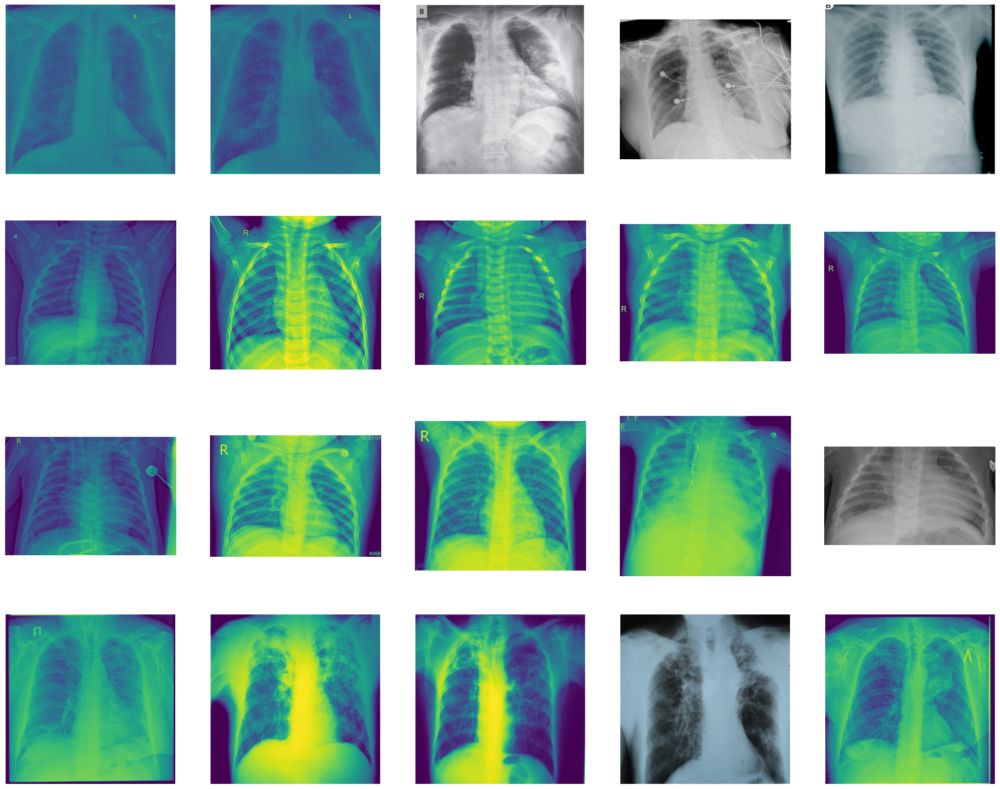

In [16]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 5
ncols = 5

# Index for iterating over images
pic_index = 0


fig = plt.gcf()
fig.set_size_inches(ncols * 5, nrows * 5)

pic_index += 5
next_cov_pix = [os.path.join(train_cov, fname) 
                for fname in train_cov_dir_fnames[pic_index-5:pic_index]]

next_normal_pix = [os.path.join(train_normal, fname) 
                for fname in train_norm_dir_fnames[pic_index-5:pic_index]]
next_pneu_pix = [os.path.join(train_pneu, fname) 
                for fname in train_pneu_dir_fnames[pic_index-5:pic_index]]
next_tb_pix = [os.path.join(train_tb, fname) 
                for fname in train_tb_dir_fnames[pic_index-5:pic_index]]

for i, img_path in enumerate(next_cov_pix+next_normal_pix+next_pneu_pix+next_tb_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [24]:
# Define the general path
path = '../input/chest-xray-pneumoniacovid19tuberculosis/'

# Use ImageDataGenerator to rescale the images
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load the images
train_generator = train_datagen.flow_from_directory(directory=path +'train', 
                                                    target_size=(224, 224),
                                                    classes=['COVID19','NORMAL','PNEUMONIA','TURBERCULOSIS'],
                                                    color_mode="grayscale",
                                                    batch_size=32,
                                                    class_mode="categorical",
                                                    shuffle=True,seed=1234)

valid_generator = valid_datagen.flow_from_directory(directory=path +'val', 
                                                    target_size=(224, 224),
                                                    color_mode="grayscale",
                                                    classes=['COVID19','NORMAL','PNEUMONIA','TURBERCULOSIS'],
                                                    batch_size=32,
                                                    class_mode="categorical",
                                                    shuffle=True,seed=1234)


test_generator = test_datagen.flow_from_directory(directory=path +'test',
                                                  target_size=(224, 224),
                                                  color_mode="grayscale",
                                                  classes=['COVID19','NORMAL','PNEUMONIA','TURBERCULOSIS'],
                                                  batch_size=1,
                                                  class_mode=None,
                                                  shuffle=False,
                                                  seed=1234)

Found 6326 images belonging to 4 classes.
Found 38 images belonging to 4 classes.
Found 771 images belonging to 4 classes.


# **CNN**

In [25]:
model= Sequential()

model.add(Conv2D(filters=128,strides= 1, kernel_size = (5,5), activation='relu', input_shape=(224,224,1,)))
model.add(MaxPool2D(3,3))

model.add(Conv2D(filters=64,kernel_size = (5,5),activation='relu'))
model.add(MaxPool2D(3,3))

model.add(Conv2D(filters=30,kernel_size = (3,3),activation='relu'))
model.add(MaxPool2D(2,2))

model.add(Conv2D(filters=30,kernel_size = (3,3),activation='relu'))
model.add(MaxPool2D(2,2))

model.add(Conv2D(filters=25,kernel_size = (3,3),activation='relu'))
model.add(MaxPool2D(2,2))

model.add(Flatten())

model.add(Dense(2048,activation='relu'))
model.add(Dense(512,activation='relu'))

model.add(Dropout(.1))

model.add(Dense(256,activation='relu'))
model.add(Dense(64,activation='relu'))

model.add(Dropout(.1))

model.add(Dense(32,activation='relu'))
model.add(Dense(4,activation = 'softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer ='adam', metrics= ['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 220, 220, 128)     3328      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 73, 73, 128)      0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 69, 69, 64)        204864    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 23, 23, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 21, 21, 30)        17310     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 10, 10, 30)      

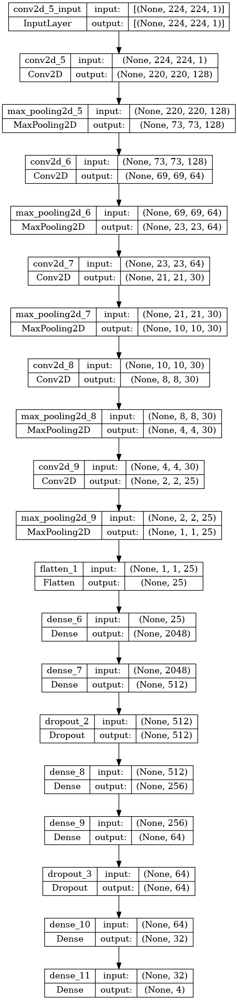

In [26]:
import tensorflow as tf
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

# **Train CNN on Train Dataset**

In [27]:
# Hyperparameters
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
# Stop the training when there is no improvement after 3 epochs trainings.
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
history=model.fit(train_generator,steps_per_epoch=STEP_SIZE_TRAIN,
          validation_data=valid_generator,verbose= 2,
          validation_steps=STEP_SIZE_VALID,
          epochs=50, callbacks=early_stop)

Epoch 1/50
197/197 - 101s - loss: 0.8548 - accuracy: 0.6640 - val_loss: 1.0158 - val_accuracy: 0.5000 - 101s/epoch - 515ms/step
Epoch 2/50
197/197 - 82s - loss: 0.3784 - accuracy: 0.8580 - val_loss: 0.7204 - val_accuracy: 0.7188 - 82s/epoch - 418ms/step
Epoch 3/50
197/197 - 83s - loss: 0.2962 - accuracy: 0.8950 - val_loss: 0.6291 - val_accuracy: 0.6562 - 83s/epoch - 421ms/step
Epoch 4/50
197/197 - 82s - loss: 0.2554 - accuracy: 0.9072 - val_loss: 0.5865 - val_accuracy: 0.7188 - 82s/epoch - 416ms/step
Epoch 5/50
197/197 - 83s - loss: 0.2469 - accuracy: 0.9164 - val_loss: 0.7532 - val_accuracy: 0.6875 - 83s/epoch - 422ms/step
Epoch 6/50
197/197 - 84s - loss: 0.1994 - accuracy: 0.9299 - val_loss: 0.6113 - val_accuracy: 0.7500 - 84s/epoch - 427ms/step
Epoch 7/50
197/197 - 84s - loss: 0.1713 - accuracy: 0.9409 - val_loss: 0.4973 - val_accuracy: 0.8125 - 84s/epoch - 426ms/step
Epoch 8/50
197/197 - 85s - loss: 0.1843 - accuracy: 0.9334 - val_loss: 0.2886 - val_accuracy: 0.8438 - 85s/epoch - 4

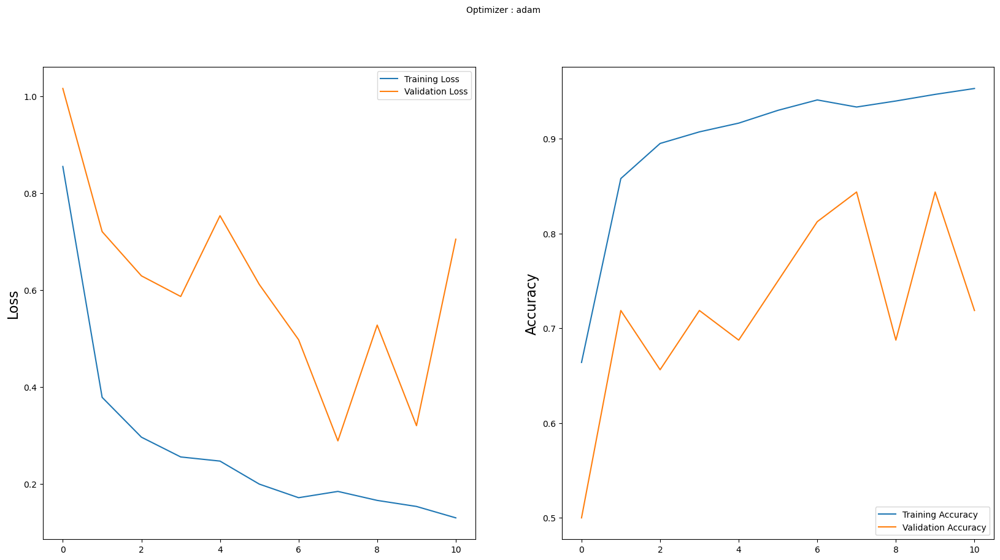

In [28]:
# plot the evolution of Loss and Acuracy on the train and validation sets

import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.suptitle('Optimizer : adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.ylabel('Accuracy', fontsize=16)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.show()

# **Predictions**

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Predict Output
STEP_SIZE_TEST = test_generator.n//test_generator.batch_size
test_generator.reset()
pred=model.predict(test_generator,
steps=STEP_SIZE_TEST,
verbose=1)

predicted_class_indices=np.argmax(pred,axis=1)

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]

771/771 [==============================] - 19s 25ms/step


In [30]:
current_idx = 0
count_accurate= 0
Actual = []
for i in predictions:
    string = test_generator.filenames[current_idx]
    substr = '/'
    actual = string[:string.find(substr)]
    Actual.append(actual)
    pred = predictions[current_idx]
    if actual == pred: 
        count_accurate += 1
    current_idx +=1
acc = count_accurate/771
print(f"The accuracy on predicted the test images is {round(acc*100,2)}%.")

The accuracy on predicted the test images is 77.95%.


In [31]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(Actual, predictions))

               precision    recall  f1-score   support

      COVID19       0.94      0.56      0.70       106
       NORMAL       0.90      0.55      0.68       234
    PNEUMONIA       0.83      0.96      0.89       390
TURBERCULOSIS       0.36      1.00      0.53        41

     accuracy                           0.78       771
    macro avg       0.75      0.77      0.70       771
 weighted avg       0.84      0.78      0.78       771



# **Data Visualisation**

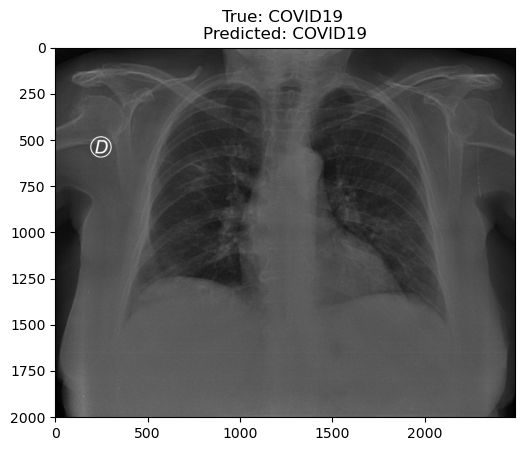

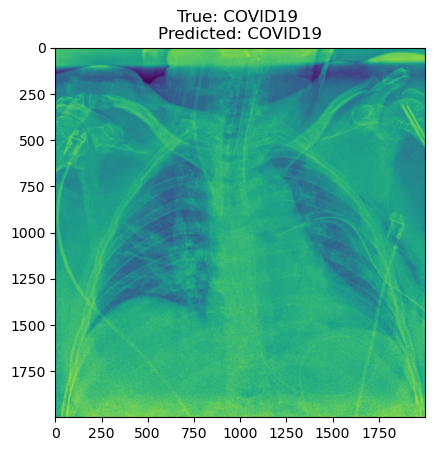

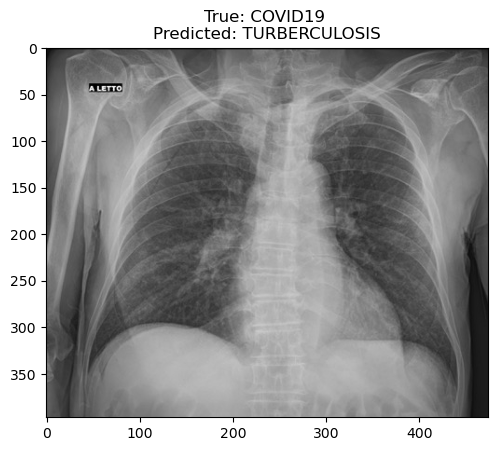

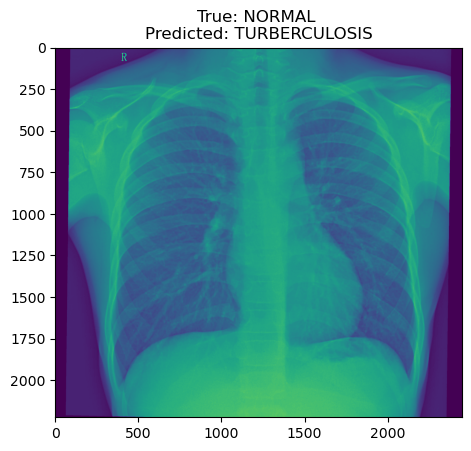

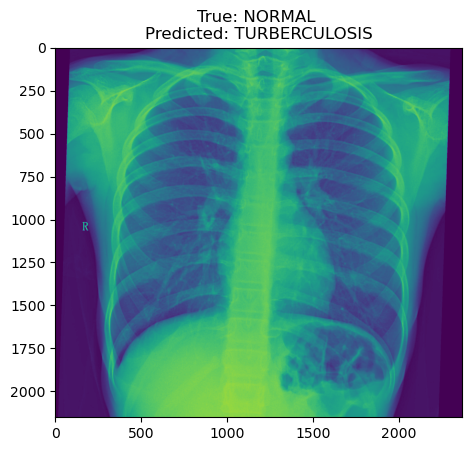

...

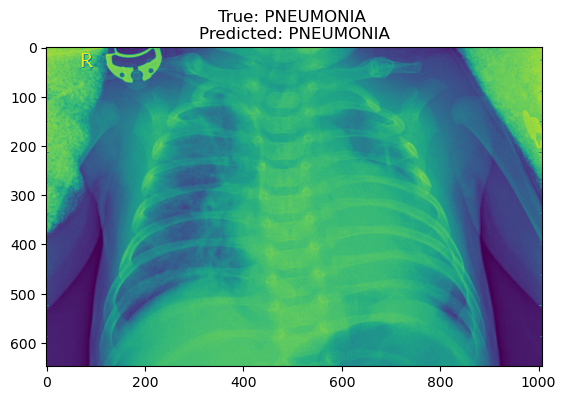

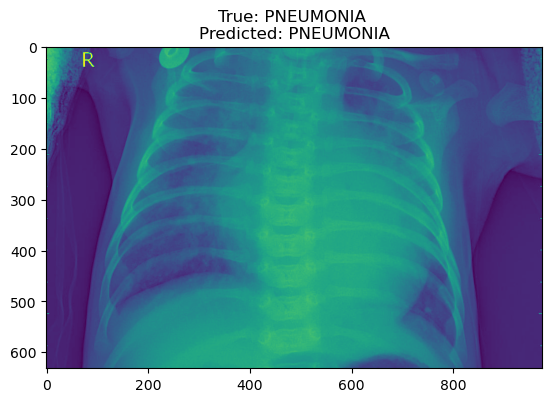

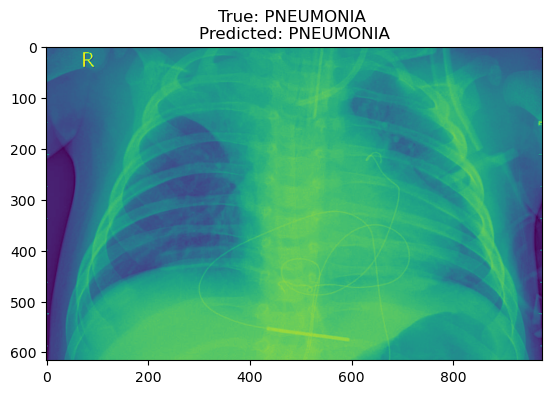

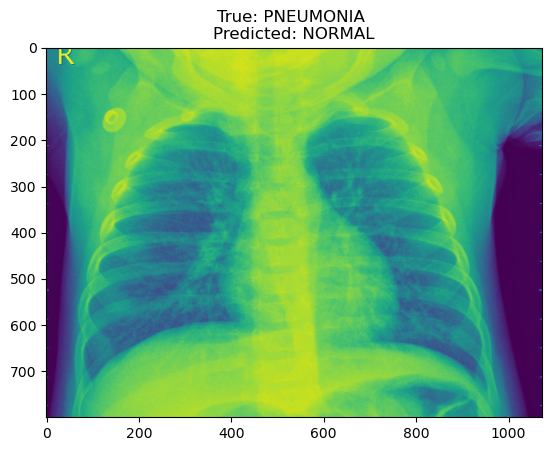

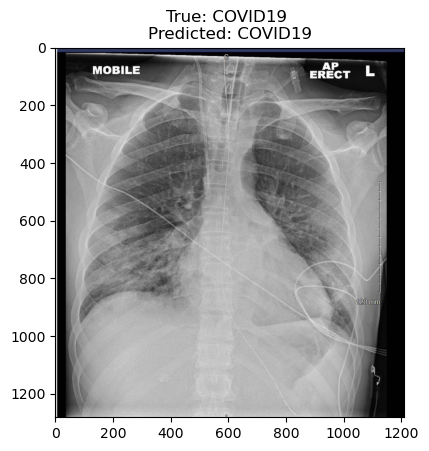

In [32]:
current = [2,37,103,189,203,274,333,375,435,478,511,58]
for i in current: 
    plt.imshow(plt.imread(path+'test/'+test_generator.filenames[i]))
    string = test_generator.filenames[i]
    substr = '/'
    actual = string[:string.find(substr)]
    plt.title(f"True: {actual} \nPredicted: {predictions[i]}")
    plt.show()

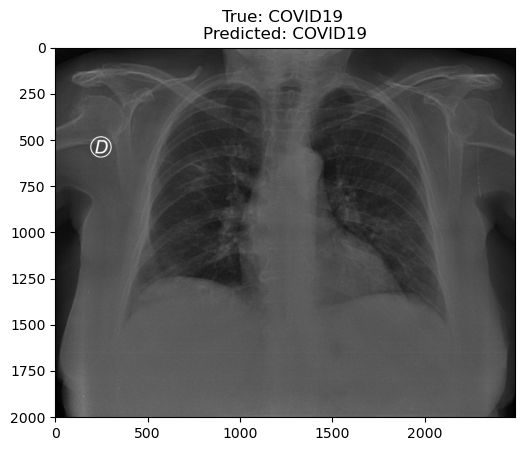

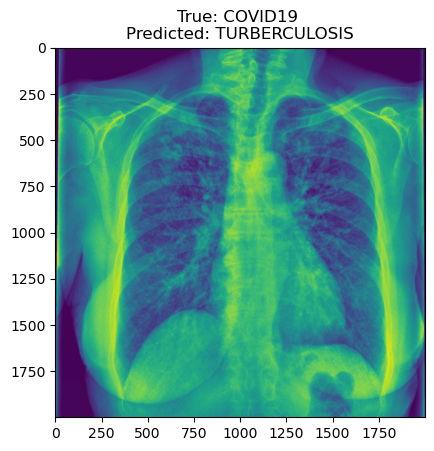

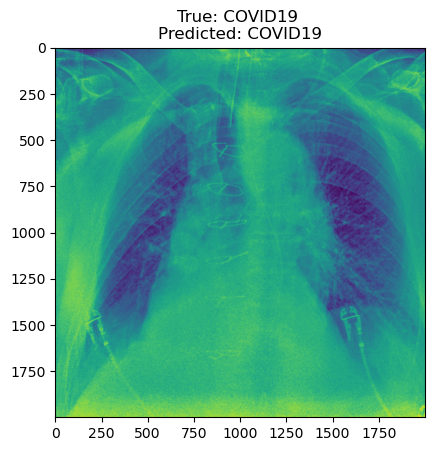

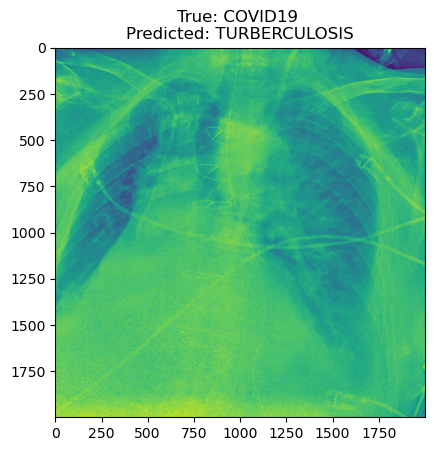

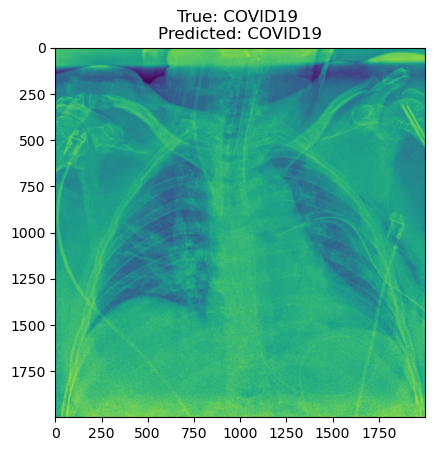

...

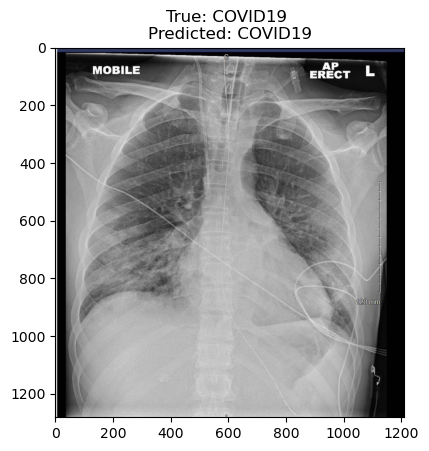

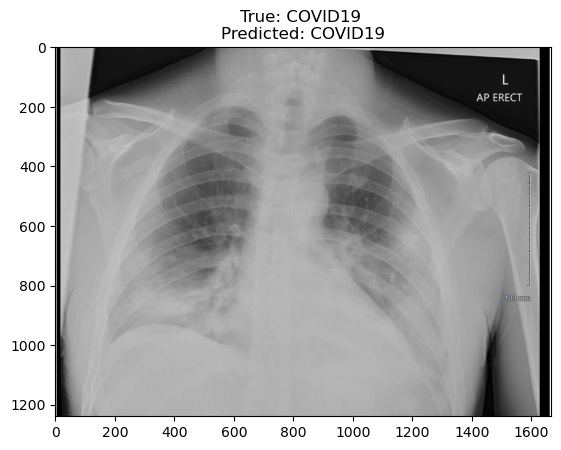

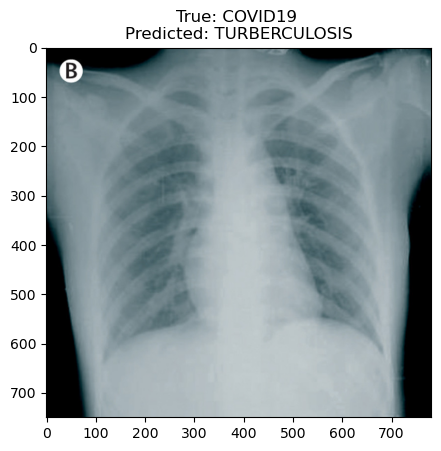

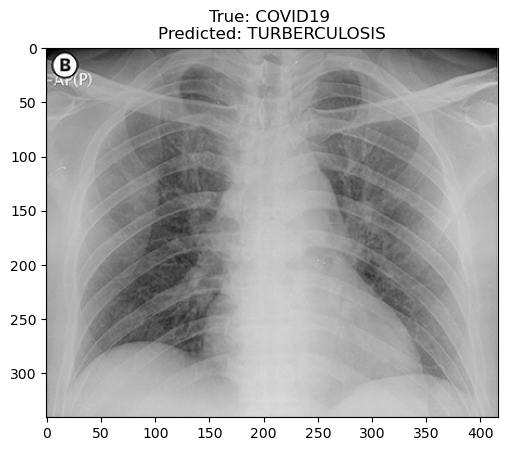

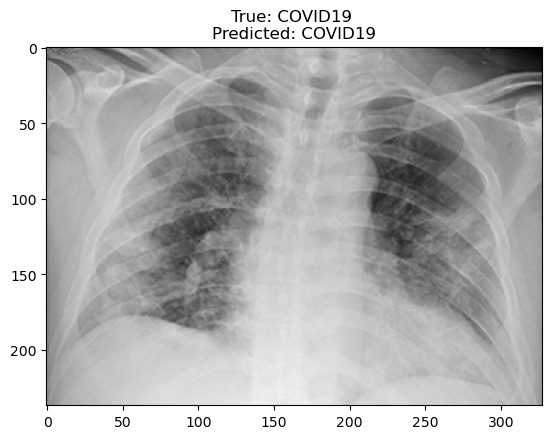

In [33]:
current = [2,3,4,5,37,103,189,203,274,333,375,435,478,511,58,59,62,67,69]
for i in current: 
    plt.imshow(plt.imread(path+'test/'+test_generator.filenames[i]))
    string = test_generator.filenames[i]
    substr = '/'
    actual = string[:string.find(substr)]
    plt.title(f"True: {actual} \nPredicted: {predictions[i]}")
    plt.show()

# **Save Model**

In [ ]:
model.save("model.h5")
print("Saved model to disk")